# ************************User Interface - Input a Query here****************************

In [2]:
#*****************************************************************************************************************************

In [3]:
# Below 3 sentence matching system will show their top 5 similar questions on the 'Text Retrieval System' section
user_query = "What's the best way to spend a long weekend?"

In [4]:
#*****************************************************************************************************************************

#  1. Data Loading and Text Preprocessing

### 1.1 Data Loading and Preprocessing

#### 1.1.1 Import Libraries

In [5]:
# import libraries
import numpy as np
import pandas as pd
import re
from collections import Counter
from collections import defaultdict
import operator
import matplotlib.pyplot as plt
import time

# Natural Language Processing
import nltk
nltk.download('omw-1.4')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
cachedStopWords = stopwords.words("english")
from nltk.stem import WordNetLemmatizer



[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\manho\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


#### 1.1.2 Data Loading and Exploring

In [6]:
# import dataset
df = pd.read_csv('data.tsv', sep='\t', header=0, error_bad_lines=False)
df

C:\Users\manho\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version.


  exec(code_obj, self.user_global_ns, self.user_ns)
b'Skipping line 83032: expected 6 fields, saw 7\n'
b'Skipping line 154657: expected 6 fields, saw 7\n'
b'Skipping line 323916: expected 6 fields, saw 7\n'
C:\Users\manho\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (1) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,id,qid1,qid2,question1,question2,is_duplicate
0,133273,213221,213222.0,How is the life of a math student? Could you d...,Which level of prepration is enough for the ex...,0.0
1,402555,536040,536041.0,How do I control my horny emotions?,How do you control your horniness?,1.0
2,360472,364011,490273.0,What causes stool color to change to yellow?,What can cause stool to come out as little balls?,0.0
3,150662,155721,7256.0,What can one do after MBBS?,What do i do after my MBBS ?,1.0
4,183004,279958,279959.0,Where can I find a power outlet for my laptop ...,"Would a second airport in Sydney, Australia be...",0.0
...,...,...,...,...,...,...
363187,57443,100941,83372.0,How do I make money flying my drone?,How can I use a dji phantom to make money,1.0
363188,278260,62873,34460.0,What can you do with an economics degree?,What jobs can you get with an economics degree?,1.0
363189,136211,217377,217378.0,What type of current does a battery produce?,How does a generator work and produce current?,0.0
363190,302720,425744,285638.0,Grammar: What is difference between schedule a...,How do I understand the difference between the...,0.0


In [7]:
# general info for dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 363192 entries, 0 to 363191
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            363192 non-null  object 
 1   qid1          363192 non-null  object 
 2   qid2          363185 non-null  float64
 3   question1     363181 non-null  object 
 4   question2     363180 non-null  object 
 5   is_duplicate  363180 non-null  float64
dtypes: float64(2), object(4)
memory usage: 16.6+ MB


In [8]:
# Unique values for all column
df.nunique()

id              363191
qid1            293850
qid2            273126
question1       265929
question2       272961
is_duplicate         2
dtype: int64

In [9]:
df.shape

(363192, 6)

#### 1.1.3 Data Preprocessing

In [10]:
# remove all nan rows
df = df = df.dropna()

In [11]:
# correct data type
df = df.astype({'qid2':'int32', 'is_duplicate':'int32'})

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 363177 entries, 0 to 363191
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            363177 non-null  object
 1   qid1          363177 non-null  object
 2   qid2          363177 non-null  int32 
 3   question1     363177 non-null  object
 4   question2     363177 non-null  object
 5   is_duplicate  363177 non-null  int32 
dtypes: int32(2), object(4)
memory usage: 16.6+ MB


In [13]:
df

,id,qid1,qid2,question1,question2,is_duplicate
0,133273,213221,213222,How is the life of a math student? Could you d...,Which level of prepration is enough for the ex...,0
1,402555,536040,536041,How do I control my horny emotions?,How do you control your horniness?,1
2,360472,364011,490273,What causes stool color to change to yellow?,What can cause stool to come out as little balls?,0
3,150662,155721,7256,What can one do after MBBS?,What do i do after my MBBS ?,1
4,183004,279958,279959,Where can I find a power outlet for my laptop ...,"Would a second airport in Sydney, Australia be...",0
...,...,...,...,...,...,...
363187,57443,100941,83372,How do I make money flying my drone?,How can I use a dji phantom to make money,1
363188,278260,62873,34460,What can you do with an economics degree?,What jobs can you get with an economics degree?,1
363189,136211,217377,217378,What type of current does a battery produce?,How does a generator work and produce current?,0
363190,302720,425744,285638,Grammar: What is difference between schedule a...,How do I understand the difference between the...,0


In [14]:
df.shape

(363177, 6)

In [15]:
# remove duplicate questions
df = df.drop_duplicates(subset = ['question1'], keep = 'last').reset_index(drop = True)
df = df.drop_duplicates(subset = ['question2'], keep = 'last').reset_index(drop = True)
df.shape

(232203, 6)

#### 1.1.4 Obtaining first 100 questions1 as evaluation set 

In [16]:
# Create 100 queries set (is_dupliacate=1) for evaluation
query_set = df[df['is_duplicate']==1][0:100]
query_set = query_set.reset_index(drop=True)

## 1.2 Text Preprocessing

### 1.2.1 Text cleaning + 1.2.2 Removing Stopwords and Non-English words + 1.2.3 Performing text normalization + 1.2.4 Removing words with length less than 3

In [17]:
# remove punctuation
df['p_question2'] = df['question2'].apply(lambda x: re.sub('[^a-zA-Z]', ' ',x))

# convert all characters to lower case
df['p_question2'] = df['p_question2'].apply(lambda x: x.lower())

# split sentences into word tokens
df['p_question2'] = df['p_question2'].apply(lambda x: x.split())

# lemmatization and remove Stopwords and remove Non-English words
lemmatizer = WordNetLemmatizer()
df['p_question2'] = df['p_question2'].apply(lambda x: [lemmatizer.lemmatize(word) for word in x if word.isalpha() and word not in cachedStopWords])

# remove 'word' with length less than 3
df['p_question2'] = df['p_question2'].apply(lambda x: [word for word in x if len(word)>2])
df['s_question2'] = df['p_question2']

# Join all tokens
df['p_question2'] = df['p_question2'].apply(lambda x: ' '.join(x))


#### questions 2 training set

In [18]:
# questions 2 training set (total 232,203 queries)
df['p_question2'] 

0                         level prepration enough exam jlpt
1                                         control horniness
2         would second airport sydney australia needed h...
3         beleive bulimic force throw atleast day eat so...
4                             become air traffic controller
                                ...                        
232198                           use dji phantom make money
232199                             job get economics degree
232200                       generator work produce current
232201    understand difference hindu calendar gregorian...
232202                             earn money online easily
Name: p_question2, Length: 232203, dtype: object

# 2. TF-IDF Based (with inverted index) 

In [19]:
# starting time
start_tfidf = time.time()

### 2.2.1 Dictionary for holding qid2 and preprocessed tokenized question 2

In [20]:
# Create dictionary for holding all question2 (tokenized)
query_dict = dict(zip(df.qid2, df.s_question2))
query_dict

{213222: ['level', 'prepration', 'enough', 'exam', 'jlpt'],
 536041: ['control', 'horniness'],
 279959: ['would',
  'second',
  'airport',
  'sydney',
  'australia',
  'needed',
  'high',
  'speed',
  'rail',
  'link',
  'created',
  'melbourne',
  'sydney'],
 193388: ['beleive',
  'bulimic',
  'force',
  'throw',
  'atleast',
  'day',
  'eat',
  'something',
  'feel',
  'guilty',
  'tell',
  'somebody'],
 96457: ['become', 'air', 'traffic', 'controller'],
 2085: ['qualified', 'sap', 'erp', 'key', 'user'],
 22333: ['best', 'book', 'tensor', 'calculus'],
 286395: ['contact', 'donald', 'knuth'],
 499790: ['die', 'rolled', 'probability', 'number', 'top'],
 28159: ['best', 'backend', 'app'],
 460955: ['type', 'government', 'france', 'currently', 'benefited', 'country'],
 62360: ['test', 'work'],
 357160: ['safe', 'unsafe', 'use', 'xiaomi', 'product'],
 189536: ['creative', 'idea', 'arranging', 'fresher', 'party'],
 506057: ['best', 'book', 'cosmology'],
 341745: ['people', 'staten', 'islan

### 2.2.2 Calculating IDF, TF, TF-IDF 

In [21]:
# function to calculate document frequency (DF) - frequency of a term is simply the number documents it occurs
def df_cal(dict_input):
    result = defaultdict(int)
    for sent in dict_input.values():
        for word in set(sent):
            result[word] +=1
    return dict(result)

# function to calculate Term frequency of specific term in specific query
def tf_cal(query, word):
    count = 0
    for i in query:
        if i == word:
            count +=1
    tf = np.log(1 + count)
    return tf    


def tfidf_cal(data, query, word):
    tf = tf_cal(query, word)
    idf = inverse_document_frequency[word]
    tfidf  = tf * idf
    return tfidf

#### Document Frequency (DF)

In [22]:
document_frequency = df_cal(query_dict)
document_frequency = dict(sorted(document_frequency.items(), key=operator.itemgetter(1),reverse=True))
document_frequency

{'best': 18472,
 'get': 11693,
 'like': 8336,
 'india': 7837,
 'good': 7741,
 'would': 6948,
 'people': 6865,
 'way': 6263,
 'one': 6050,
 'make': 5875,
 'year': 4651,
 'time': 4495,
 'use': 4265,
 'difference': 4238,
 'life': 4173,
 'work': 4112,
 'much': 4016,
 'want': 3698,
 'know': 3646,
 'job': 3634,
 'thing': 3510,
 'many': 3437,
 'indian': 3238,
 'book': 3226,
 'quora': 3213,
 'learn': 3208,
 'think': 3151,
 'someone': 3082,
 'better': 3055,
 'find': 2997,
 'new': 2947,
 'girl': 2834,
 'become': 2816,
 'day': 2804,
 'company': 2797,
 'ever': 2795,
 'mean': 2775,
 'start': 2766,
 'take': 2735,
 'money': 2732,
 'world': 2678,
 'feel': 2619,
 'movie': 2602,
 'first': 2485,
 'without': 2447,
 'country': 2291,
 'student': 2275,
 'need': 2256,
 'love': 2248,
 'online': 2203,
 'used': 2193,
 'woman': 2146,
 'possible': 2141,
 'buy': 2139,
 'could': 2111,
 'person': 2088,
 'business': 2086,
 'question': 2086,
 'engineering': 2080,
 'college': 2054,
 'friend': 1991,
 'old': 1986,
 'phone

#### Inverse Document Frequency (IDF)

In [23]:
inverse_document_frequency = {}
N = len(df['p_question2'])
for key in document_frequency:    
    inverse_document_frequency[key] =N/document_frequency[key]

In [24]:
inverse_document_frequency

{'best': 12.570539194456474,
 'get': 19.858291285384418,
 'like': 27.8554462571977,
 'india': 29.629067245119305,
 'good': 29.996512078542825,
 'would': 33.42012089810017,
 'people': 33.824180626365624,
 'way': 37.07536324445154,
 'one': 38.3806611570248,
 'make': 39.52391489361702,
 'year': 49.925392388733606,
 'time': 51.65806451612903,
 'use': 54.44384525205158,
 'difference': 54.790703161868805,
 'life': 55.64414090582315,
 'work': 56.469601167315176,
 'much': 57.819472111553786,
 'want': 62.79150892374256,
 'know': 63.68705430608887,
 'job': 63.89735828288387,
 'thing': 66.15470085470085,
 'many': 67.559790514984,
 'indian': 71.7118591723286,
 'book': 71.978611283323,
 'quora': 72.26984126984127,
 'learn': 72.3824812967581,
 'think': 73.69184385909236,
 'someone': 75.34166125892278,
 'better': 76.0075286415712,
 'find': 77.47847847847848,
 'new': 78.79300984051578,
 'girl': 81.93472124206069,
 'become': 82.45845170454545,
 'day': 82.81134094151213,
 'company': 83.01859134787271,
 

#### TF-IDF of distinct term in specific query

In [25]:
tfidf_word_query = {}
for qid2, query in query_dict.items():
    for word in query:
        word_in_query_tfidf = {}
        word_tfidf = tfidf_cal(df['p_question2'], query, word)
        word_in_query_tfidf[qid2] = word_tfidf
        if word in tfidf_word_query:
            tfidf_word_query[word].update(word_in_query_tfidf)
        else:
            tfidf_word_query.update({word:word_in_query_tfidf})

In [26]:
tfidf_word_query

{'level': {213222: 241.6679501014429,
  367551: 383.0346385369386,
  254296: 241.6679501014429,
  485473: 241.6679501014429,
  414089: 241.6679501014429,
  521769: 241.6679501014429,
  432456: 241.6679501014429,
  190782: 241.6679501014429,
  417079: 241.6679501014429,
  493844: 383.0346385369386,
  347906: 241.6679501014429,
  105531: 241.6679501014429,
  259668: 241.6679501014429,
  410111: 383.0346385369386,
  154031: 561.1356029743774,
  89831: 241.6679501014429,
  331719: 241.6679501014429,
  171283: 241.6679501014429,
  523977: 241.6679501014429,
  427309: 241.6679501014429,
  336462: 241.6679501014429,
  260617: 241.6679501014429,
  472806: 241.6679501014429,
  116368: 241.6679501014429,
  164084: 241.6679501014429,
  480545: 241.6679501014429,
  232400: 241.6679501014429,
  63566: 241.6679501014429,
  181316: 241.6679501014429,
  440177: 241.6679501014429,
  245823: 241.6679501014429,
  59279: 241.6679501014429,
  204352: 241.6679501014429,
  525846: 241.6679501014429,
  9576: 

### 2.2.3 Sentence matching by calculating Accumulated TF-IDF

In [27]:
# function to sum up values of 2 dictionaries
def sumDict(dict1, dict2):
   dict3 = {**dict1, **dict2}
   for key, value in dict3.items():
       if key in dict1 and key in dict2:
               dict3[key] = value + dict1[key]
   return dict3


# function to match and get top N queries according to their scores
def tfidf_text_matching(input_query, topN):
    
    # preprocess query
    p_input_query = re.sub('[^a-zA-Z]', ' ',input_query)
    p_input_query = p_input_query.lower()
    p_input_query = p_input_query.split()
    p_input_query = [lemmatizer.lemmatize(word) for word in p_input_query if word.isalpha() and word not in cachedStopWords]
    p_input_query = [word for word in p_input_query if len(word)>2]
    
    word_dict = {}
    
    for word in p_input_query:
        if word in tfidf_word_query.keys():
            word_dict = sumDict(tfidf_word_query[word], word_dict)
    word_dict = sorted(word_dict.items(), key=operator.itemgetter(1),reverse=True)  
    return word_dict[0:topN]

In [28]:
# example
score_list = tfidf_text_matching('What are some of the most beautiful houses in the world?',5)
score_list

[(113628, 775.527572285666),
 (494006, 719.233212595153),
 (19797, 719.233212595153),
 (298966, 680.2695180416029),
 (65209, 680.2695180416029)]

In [29]:
# ground truth is equal to qid2
ground_truth_id_list = query_set['qid2']

In [30]:
# function to list out top 2 ranking
def top2_score(score_list, ground_truth):
    mark = 0
    for i in range(2):
        if ground_truth == score_list[i][0]:
            mark = 1
    return mark

# function to list out top 5 ranking
def top5_score(score_list, ground_truth):
    mark = 0
    for i in range(5):
        if ground_truth == score_list[i][0]:
            mark = 1
    return mark

In [31]:
# function for TF-IDF Text Retrieval/Sentence Matching System
def tfidf_answer(query):
    billboard = tfidf_text_matching(query,5)
    print('Query: ' + query)
    print('---------------------------------------------------------------------------')
    print('Top 5 Similar Questions:' + '\n')
    print('1. ' + pd.Series.to_string(df[df['qid2']==billboard[0][0]]['question2'])[9:] + '\n')
    print('2. ' + pd.Series.to_string(df[df['qid2']==billboard[1][0]]['question2'])[9:]+ '\n')
    print('3. ' + pd.Series.to_string(df[df['qid2']==billboard[2][0]]['question2'])[9:]+ '\n')
    print('4. ' + pd.Series.to_string(df[df['qid2']==billboard[3][0]]['question2'])[9:]+ '\n')
    print('5. ' + pd.Series.to_string(df[df['qid2']==billboard[4][0]]['question2'])[9:])

# display all the string in questions
pd.options.display.max_colwidth = 200

## Evaluation (TF IDF)

In [32]:
# calculate the number of matches ranked into top 2 and top 5
def tfidf_evaluation():

    total_top2_score = 0
    total_top5_score = 0

    for i in range(len(query_set)):
        score_list = tfidf_text_matching(query_set['question1'][i],5)
        total_top2_score += top2_score(score_list, ground_truth_id_list[i])
        total_top5_score += top5_score(score_list, ground_truth_id_list[i])
        
    return [total_top2_score, total_top5_score]

tfidf_evaluation_score = tfidf_evaluation()

print("Number of matches ranked top2 within 100 queries: ", tfidf_evaluation_score[0])
print("Number of matches ranked top5 within 100 queries: ", tfidf_evaluation_score[1])
print("Probability that ground-truth ranked into top2 within 100 queries: ", tfidf_evaluation_score[0]/100)
print("Probability that ground-truth ranked into top5 within 100 queries: ", tfidf_evaluation_score[1]/100)


Number of matches ranked top2 within 100 queries:  36
Number of matches ranked top5 within 100 queries:  56
Probability that ground-truth ranked into top2 within 100 queries:  0.36
Probability that ground-truth ranked into top5 within 100 queries:  0.56


## Text Retrieval System (TF IDF) for user query

In [33]:
tfidf_answer(user_query)

Query: What's the best way to spend a long weekend?
---------------------------------------------------------------------------
Top 5 Similar Questions:

1. Why can't every weekend be a 3-day weekend?

2.  What weekend retreats exist that I can go to for a weekend solely for the purpose of not having to travel alone and meet new people?

3.  Today is Monday the 16th of March. If I were to say to you "I'll see you next weekend", to which weekend would you think I was referring?

4.  What is the best way to spend a long weekend in Edinburgh?

5.  What is a good way to spend a long weekend in and around Bangalore?


In [34]:
# end time
end_tfidf = time.time()
time_tfidf = end_tfidf - start_tfidf
# total time taken
print(f"Runtime of the TF-IDF is {time_tfidf}")

Runtime of the TF-IDF is 16.6042640209198


# 3. Sentence embedding (averaging word embedding)

In [35]:
# starting tine
start_avgword = time.time()

#### Read GloVe_50D data

In [36]:
# read pretrained word embedding data (glove.6B.50d.txt) into a dictionary
word_vectors = {}
glove_data = open(r'C:\Users\manho\Downloads\glove.6B\glove.6B.50d.txt', encoding='utf-8')
for line in glove_data:
    vector = line.split()
    word = vector[0]
    vector_value = np.asarray(vector[1:], dtype='float32')
    word_vectors[word] = vector_value
glove_data.close()

### 3.2.1 Calculating Sentence Embedding by Averaging Word Embedding

In [37]:
# function to calculate the sentence word embedding(average word embedding) by using word vectors
def sentence_vector_avgword(sentence):
    
    sentence_vector = []
    words_vector_list = []
    num_words = 0
    words_list = sentence.split()
    
    for word in words_list:
        if word in word_vectors:
            # count the number of words in glove.6B.50d.txt for each query
            num_words = num_words + 1  
            # add the word vector data in list
            words_vector_list.append (word_vectors[word])
    
    # if there is at least one word (in glove.6B.50d.txt) in sentence
    if (num_words != 0):             
        words_vector_list = np.array(words_vector_list)
        sentence_vector = np.array(sum(words_vector_list,0))/num_words

    else:
        # zero vector if there is no word (in glove.6B.50d.txt) in sentence
        sentence_vector = np.zeros(50)

    return sentence_vector

In [38]:
# example
sentence_vector_avgword("level prepration enough exam")

array([-0.21518333,  0.4141133 ,  0.21659666, -0.60723335,  0.11683998,
       -0.29642066,  0.31072667,  0.21755   ,  0.25605264,  0.16642866,
        0.05856934, -0.3923967 ,  0.18966998,  0.00566167,  0.210093  ,
        0.17165999,  0.05175668,  0.02109633, -0.29709   , -0.64503825,
        0.056241  ,  0.18424667,  0.40910003, -0.11408001,  0.12711333,
       -1.2384167 , -0.16143334,  0.04571332, -0.22717996, -0.03187335,
        3.1006668 ,  0.5045133 , -0.23052333, -0.8086867 ,  0.63164   ,
        0.29042003,  0.51923   ,  0.72408324,  0.44337332, -0.76090336,
       -0.214118  , -0.33933   ,  0.16271667,  0.83408   , -0.37069666,
       -0.34305   ,  0.81753   ,  0.63513666,  0.34739664,  0.113053  ],
      dtype=float32)

In [39]:
# calculate the sentence embedding vector for question 2 set
df['p_question2_mean_vector'] = df['p_question2'].apply(lambda x: sentence_vector_avgword(x))
df['p_question2_mean_vector']
df['p_question2_mean_vector'].tolist()

[array([-0.21518333,  0.4141133 ,  0.21659666, -0.60723335,  0.11683998,
        -0.29642066,  0.31072667,  0.21755   ,  0.25605264,  0.16642866,
         0.05856934, -0.3923967 ,  0.18966998,  0.00566167,  0.210093  ,
         0.17165999,  0.05175668,  0.02109633, -0.29709   , -0.64503825,
         0.056241  ,  0.18424667,  0.40910003, -0.11408001,  0.12711333,
        -1.2384167 , -0.16143334,  0.04571332, -0.22717996, -0.03187335,
         3.1006668 ,  0.5045133 , -0.23052333, -0.8086867 ,  0.63164   ,
         0.29042003,  0.51923   ,  0.72408324,  0.44337332, -0.76090336,
        -0.214118  , -0.33933   ,  0.16271667,  0.83408   , -0.37069666,
        -0.34305   ,  0.81753   ,  0.63513666,  0.34739664,  0.113053  ],
       dtype=float32),
 array([ 0.69869 , -1.1051  ,  0.57929 ,  0.20768 , -0.29897 ,  0.027056,
         0.32954 , -0.18935 ,  0.47732 , -0.51929 ,  0.63857 ,  0.013808,
        -0.53906 , -0.028689, -0.84782 ,  0.81637 ,  0.079286,  0.047549,
        -0.084431, -0.19

### 3.2.2 Sentence matching by calculating cosine similarity

In [40]:
# function to calculate cosine similarity between two vectors a and b
def cosine_sim(a, b):

    a = np.array(a)
    b = np.array(b)
    
    denominator = (np.sqrt(np.sum(a**2)) * np.sqrt(np.sum(b**2)))

    if denominator != 0:
      cos = float ( (np.dot(a, b)) / denominator )
    else:
    # prevent DIV/0! error
      cos = -1.0

    return cos

In [41]:
# function to calculate the cosine similarity of one single query vs the whole question2 set
def similarity_avg_word(input_query, topN) :

    # preprocess query
    p_input_query = re.sub('[^a-zA-Z]', ' ',input_query)
    p_input_query = p_input_query.lower()
    p_input_query = p_input_query.split()
    p_input_query = [lemmatizer.lemmatize(word) for word in p_input_query if word.isalpha() and word not in cachedStopWords]
    p_input_query = [word for word in p_input_query if len(word)>2]
    p_input_query = ' '.join(p_input_query)
       
    query_vector = sentence_vector_avgword(p_input_query)    

    cosine_similarities = []
    billboard = {}

    n = 0
    for i in df['p_question2_mean_vector'].tolist():
        cos_sim_val = cosine_sim(query_vector, i)
        cosine_similarities.append(cos_sim_val)
        billboard[df['qid2'][n]] = cos_sim_val
        n += 1
        
    # sort by descending order
    billboard = sorted(billboard.items(), key = lambda x:(x[1], x[0]),reverse = True)

    return billboard[0:topN]

In [42]:
# function for Sentence embedding -Average Word Embedding Text Retrieval/Sentence Matching System
def sentence_embedding_avgword_answer(query):
    billboard = similarity_avg_word(query,5)
    print('Query: ' + query)
    print('---------------------------------------------------------------------------')
    print('Top 5 Similar Questions:' + '\n')
    print('1. ' + pd.Series.to_string(df[df['qid2']==billboard[0][0]]['question2'])[9:] + '\n')
    print('2. ' + pd.Series.to_string(df[df['qid2']==billboard[1][0]]['question2'])[9:]+ '\n')
    print('3. ' + pd.Series.to_string(df[df['qid2']==billboard[2][0]]['question2'])[9:]+ '\n')
    print('4. ' + pd.Series.to_string(df[df['qid2']==billboard[3][0]]['question2'])[9:]+ '\n')
    print('5. ' + pd.Series.to_string(df[df['qid2']==billboard[4][0]]['question2'])[9:])

In [43]:
# function to calculate the cosine similarity of evaluation set (100 question1) vs the whole question2 set
def avg_word_embedding_evaluation():

    total_top2_score = 0
    total_top5_score = 0

    for i in range(len(query_set)):
        score_list = similarity_avg_word(query_set['question1'][i],5)
        # calculate the number of matches ranked into top 2 and top 5
        total_top2_score += top2_score(score_list, ground_truth_id_list[i])
        total_top5_score += top5_score(score_list, ground_truth_id_list[i])
        
    return [total_top2_score, total_top5_score]

avg_word_embedding_evaluation_score = avg_word_embedding_evaluation()

print("Number of matches ranked top2 within 100 queries: ", avg_word_embedding_evaluation_score[0])
print("Number of matches ranked top5 within 100 queries: ", avg_word_embedding_evaluation_score[1])
print("Probability that ground-truth ranked into top2 within 100 queries: ", avg_word_embedding_evaluation_score[0]/100)
print("Probability that ground-truth ranked into top5 within 100 queries: ", avg_word_embedding_evaluation_score[1]/100)

Number of matches ranked top2 within 100 queries:  60
Number of matches ranked top5 within 100 queries:  69
Probability that ground-truth ranked into top2 within 100 queries:  0.6
Probability that ground-truth ranked into top5 within 100 queries:  0.69


## Text Retrieval System (Sentence embedding -Average Word Embedding) for user query

In [44]:
sentence_embedding_avgword_answer(user_query)

Query: What's the best way to spend a long weekend?
---------------------------------------------------------------------------
Top 5 Similar Questions:

1.  What are the best ways to spend time on weekends?

2. What's the best way to spend time with you?

3.  What is the best way to spend a long weekend in Edinburgh?

4. I just started a $19 an hour job. I work only 3 days a week. What are the best ways to spend my off time to make money?

5.  What are the good ways to spend evening time?


In [45]:
# end time
end_avgword = time.time()
time_avgword = end_avgword - start_avgword

# total time taken
print(f"Runtime of sentence embedding (avgerage word embedding) is {time_avgword}")

Runtime of sentence embedding (avgerage word embedding) is 650.1843559741974


# 4. Sentence embedding (Downweight frequency words)

In [46]:
# starting time
start_downweight = time.time()

### 4.2.1 Calculating Sentence Embedding by summing up Word Embedding (with Down weight factor)

In [47]:
document_frequency

{'best': 18472,
 'get': 11693,
 'like': 8336,
 'india': 7837,
 'good': 7741,
 'would': 6948,
 'people': 6865,
 'way': 6263,
 'one': 6050,
 'make': 5875,
 'year': 4651,
 'time': 4495,
 'use': 4265,
 'difference': 4238,
 'life': 4173,
 'work': 4112,
 'much': 4016,
 'want': 3698,
 'know': 3646,
 'job': 3634,
 'thing': 3510,
 'many': 3437,
 'indian': 3238,
 'book': 3226,
 'quora': 3213,
 'learn': 3208,
 'think': 3151,
 'someone': 3082,
 'better': 3055,
 'find': 2997,
 'new': 2947,
 'girl': 2834,
 'become': 2816,
 'day': 2804,
 'company': 2797,
 'ever': 2795,
 'mean': 2775,
 'start': 2766,
 'take': 2735,
 'money': 2732,
 'world': 2678,
 'feel': 2619,
 'movie': 2602,
 'first': 2485,
 'without': 2447,
 'country': 2291,
 'student': 2275,
 'need': 2256,
 'love': 2248,
 'online': 2203,
 'used': 2193,
 'woman': 2146,
 'possible': 2141,
 'buy': 2139,
 'could': 2111,
 'person': 2088,
 'business': 2086,
 'question': 2086,
 'engineering': 2080,
 'college': 2054,
 'friend': 1991,
 'old': 1986,
 'phone

#### Downweight factor for each distinct word

In [48]:
distinct_words_downweight_factor = document_frequency.copy()
for key in distinct_words_downweight_factor:    
    distinct_words_downweight_factor[key] =1/(np.log(document_frequency[key]) +1 )
distinct_words_downweight_factor

{'best': 0.09238719062359825,
 'get': 0.09646228755405051,
 'like': 0.09971741317619925,
 'india': 0.10033500466357612,
 'good': 0.1004592377803224,
 'would': 0.10156192978078887,
 'people': 0.10168604287259526,
 'way': 0.10264395869517406,
 'one': 0.10300980697084222,
 'make': 0.10332220845571359,
 'year': 0.10587794622255943,
 'time': 0.10626178436720128,
 'use': 0.10685818548735036,
 'difference': 0.10693075153253598,
 'life': 0.1071077738317389,
 'work': 0.107276974734661,
 'much': 0.10754952885987487,
 'want': 0.10851227336789525,
 'know': 0.10867927993289661,
 'job': 0.10871823189946643,
 'thing': 0.10913014058523716,
 'many': 0.10938101606193369,
 'indian': 0.1100992848083065,
 'book': 0.11014431014383991,
 'quora': 0.110193318805574,
 'learn': 0.11021223276625952,
 'think': 0.11043042848063558,
 'someone': 0.11070109864664139,
 'better': 0.11080903495052642,
 'find': 0.11104489051082854,
 'new': 0.11125273605749883,
 'girl': 0.11173877986629202,
 'become': 0.11181839079402871,


In [49]:
# function to calculate the sentence word embedding(average word embedding) by using word vectors
def sentence_vector_downweight(sentence):
    
    sentence_vector = []
    words_vector_list = []
    score = []
    num_words = 0
    words_list = sentence.split()
    
    
    for word in words_list:
        if word in word_vectors:
            # count the number of words in glove.6B.50d.txt for each query
            num_words = num_words + 1  
            # add the word vector data in list
            # vector multipy down weight factor
            words_vector_list.append((np.array(word_vectors[word]))*distinct_words_downweight_factor.get(word,0)) 
     
    
    # if there is at least one word (in glove.6B.50d.txt) in sentence
    if (num_words != 0):    
        words_vector_list = np.array(words_vector_list)
        sentence_vector = np.array(sum(words_vector_list,0))
        
    else:
        # zero vector if there is no word (in glove.6B.50d.txt) in sentence
        sentence_vector = np.zeros(50)

    return sentence_vector

In [50]:
# calculate the sentence embedding vector for question 2 set
df['p_question2_mean_vector_downweight'] = df['p_question2'].apply(lambda x: sentence_vector_downweight(x))
df['p_question2_mean_vector_downweight'].tolist()

[array([-7.52649158e-02,  1.58502042e-01,  9.37327296e-02, -2.38470763e-01,
         5.94146475e-02, -1.18276462e-01,  1.18477084e-01,  8.61035883e-02,
         9.33266059e-02,  7.26196095e-02,  2.05126014e-02, -1.44926727e-01,
         6.81479573e-02, -1.14879385e-03,  8.29141736e-02,  7.32687712e-02,
         3.94012630e-02,  1.23559944e-02, -1.18198290e-01, -2.68428534e-01,
         1.63296759e-02,  6.82808533e-02,  1.61913127e-01, -5.01433164e-02,
         5.03306165e-02, -4.95938301e-01, -6.03199825e-02,  2.69220546e-02,
        -6.61040395e-02, -5.94928116e-03,  1.24101543e+00,  2.03627124e-01,
        -8.15455541e-02, -3.16207945e-01,  2.39975497e-01,  1.11954026e-01,
         1.86893061e-01,  2.81875253e-01,  1.65429309e-01, -3.03390741e-01,
        -8.40007737e-02, -1.27571911e-01,  6.74675554e-02,  3.15035701e-01,
        -1.37251720e-01, -1.22536026e-01,  3.02977979e-01,  2.42539987e-01,
         1.25308231e-01,  4.78285030e-02], dtype=float32),
 array([ 0.09511634, -0.15044

In [51]:
# function to calculate the cosine similarity of one single query vs the whole question2 set
def similarity_downweight(input_query, topN) :

    # preprocess query
    p_input_query = re.sub('[^a-zA-Z]', ' ',input_query)
    p_input_query = p_input_query.lower()
    p_input_query = p_input_query.split()
    p_input_query = [lemmatizer.lemmatize(word) for word in p_input_query if word.isalpha() and word not in cachedStopWords]
    p_input_query = [word for word in p_input_query if len(word)>2]
    p_input_query = ' '.join(p_input_query)
       
    query_vector = sentence_vector_downweight(p_input_query)    

    cosine_similarities = []
    billboard = {}

    n = 0
    for i in df['p_question2_mean_vector_downweight'].tolist():
        cos_sim_val = cosine_sim(query_vector,i)
        cosine_similarities.append(cos_sim_val)
        billboard[df['qid2'][n]] = cos_sim_val 
        n += 1
    
    # sort by descending order
    billboard = sorted(billboard.items(), key = lambda x:(x[1], x[0]),reverse = True)

    return billboard[0:topN]

In [52]:
# function for Sentence embedding - Down Weight Frequent Wrods Text Retrieval/Sentence Matching System
def sentence_embedding_downweight_answer(query):
    billboard = similarity_downweight(query,5)
    print('Query: ' + query)
    print('---------------------------------------------------------------------------')
    print('Top 2 Similar Questions:' + '\n')
    print('1. ' + pd.Series.to_string(df[df['qid2']==billboard[0][0]]['question2'])[9:] + '\n')
    print('2. ' + pd.Series.to_string(df[df['qid2']==billboard[1][0]]['question2'])[9:]+ '\n')
    print('3. ' + pd.Series.to_string(df[df['qid2']==billboard[2][0]]['question2'])[9:]+ '\n')
    print('4. ' + pd.Series.to_string(df[df['qid2']==billboard[3][0]]['question2'])[9:]+ '\n')
    print('5. ' + pd.Series.to_string(df[df['qid2']==billboard[4][0]]['question2'])[9:])

In [53]:
# function to calculate the cosine similarity of evaluation set (100 question1) vs the whole question2 set
def downweight_word_embedding_evaluation():

    total_top2_score = 0
    total_top5_score = 0
    
    # calculate the number of matches ranked into top 2 and top 5
    for i in range(len(query_set)):
        score_list = similarity_downweight(query_set['question1'][i],5)
        total_top2_score += top2_score(score_list, ground_truth_id_list[i])
        total_top5_score += top5_score(score_list, ground_truth_id_list[i])
        
    return [total_top2_score, total_top5_score]

downweight_word_embedding_evaluation_score = downweight_word_embedding_evaluation()

print("Number of matches ranked top2 within 100 queries: ", downweight_word_embedding_evaluation_score[0])
print("Number of matches ranked top5 within 100 queries: ", downweight_word_embedding_evaluation_score[1])
print("Probability that ground-truth ranked into top2 within 100 queries: ", downweight_word_embedding_evaluation_score[0]/100)
print("Probability that ground-truth ranked into top5 within 100 queries: ", downweight_word_embedding_evaluation_score[1]/100)

Number of matches ranked top2 within 100 queries:  60
Number of matches ranked top5 within 100 queries:  67
Probability that ground-truth ranked into top2 within 100 queries:  0.6
Probability that ground-truth ranked into top5 within 100 queries:  0.67


## Text Retrieval System (Sentence embedding - Downweight Frequent Words) for user query

In [54]:
sentence_embedding_downweight_answer(user_query)

Query: What's the best way to spend a long weekend?
---------------------------------------------------------------------------
Top 2 Similar Questions:

1.  What are the best ways to spend time on weekends?

2.  What is the best way to spend the weekends ? (IT people)

3. I just started a $19 an hour job. I work only 3 days a week. What are the best ways to spend my off time to make money?

4.  What is a good way to spend a long weekend in and around Bangalore?

5.  How do I spend time alone in the weekend?


In [55]:
# end time
end_downweight = time.time()
time_downweight = end_downweight - start_downweight

# total time taken
print(f"Runtime of sentence embedding (down weight frequent words) is {time_downweight}")

Runtime of sentence embedding (down weight frequent words) is 626.1395382881165


# 5.	Comparison & Evaluation

### Accuracy Rate

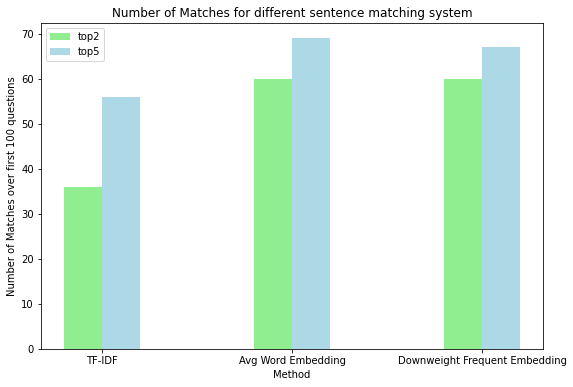

In [56]:
X = ['TF-IDF','Avg Word Embedding','Downweight Frequent Embedding']
top2 = [tfidf_evaluation_score[0],avg_word_embedding_evaluation_score[0],downweight_word_embedding_evaluation_score[0]]
top5 = [tfidf_evaluation_score[1],avg_word_embedding_evaluation_score[1],downweight_word_embedding_evaluation_score[1]]
  
X_axis = np.arange(len(X))

plt.figure(figsize=(9,6))
plt.bar(X_axis - 0.1, top2, 0.2, label = 'top2', color = 'lightgreen')
plt.bar(X_axis + 0.1, top5, 0.2, label = 'top5', color = 'lightblue')
  
plt.xticks(X_axis, X)

plt.xlabel("Method")
plt.ylabel("Number of Matches over first 100 questions")
plt.title("Number of Matches for different sentence matching system")
plt.legend()
plt.show()

### Running Time

No handles with labels found to put in legend.


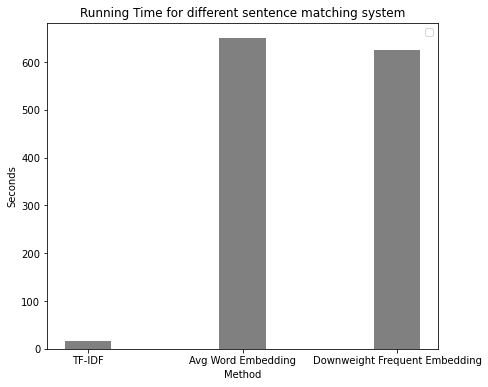

In [57]:
X = ['TF-IDF','Avg Word Embedding','Downweight Frequent Embedding']
run_time = [time_tfidf, time_avgword, time_downweight]

X_axis = np.arange(len(X))

plt.figure(figsize=(7,6))
plt.bar(X_axis, run_time, 0.3, color = 'grey')

plt.xticks(X_axis, X)

plt.xlabel("Method")
plt.ylabel("Seconds")
plt.title("Running Time for different sentence matching system")
plt.legend()
plt.show()